In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
os.getcwd()

'C:\\Users\\saiaj'

In [2]:
df=pd.read_csv('Supermarket_sales_prediction.csv')
df

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.300,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.920,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.500,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.200,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.930,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052
...,...,...,...,...,...,...,...,...,...,...,...,...
8518,FDF22,6.865,Low Fat,0.056783,Snack Foods,214.5218,OUT013,1987,High,Tier 3,Supermarket Type1,2778.3834
8519,FDS36,8.380,Regular,0.046982,Baking Goods,108.1570,OUT045,2002,NaN,Tier 2,Supermarket Type1,549.2850
8520,NCJ29,10.600,Low Fat,0.035186,Health and Hygiene,85.1224,OUT035,2004,Small,Tier 2,Supermarket Type1,1193.1136
8521,FDN46,7.210,Regular,0.145221,Snack Foods,103.1332,OUT018,2009,Medium,Tier 3,Supermarket Type2,1845.5976


In [3]:
df.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [4]:
df.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB


In [6]:
df.columns

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Outlet_Sales'],
      dtype='object')

In [7]:
columns_list=df.columns
columns_list

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Outlet_Sales'],
      dtype='object')

In [8]:
for i in columns_list:
    print(i," : \n",df[i].unique())
    print("***\n")

Item_Identifier  : 
 ['FDA15' 'DRC01' 'FDN15' ... 'NCF55' 'NCW30' 'NCW05']
***

Item_Weight  : 
 [ 9.3    5.92  17.5   19.2    8.93  10.395 13.65     nan 16.2   11.8
 18.5   15.1   17.6   16.35   9.    13.35  18.85  14.6   13.85  13.
  7.645 11.65   5.925 19.25  18.6   18.7   17.85  10.     8.85   9.8
 13.6   21.35  12.15   6.42  19.6   15.85   7.39  10.195  9.895 10.895
  7.905  9.195  8.365  7.97  17.7   19.35   8.645 15.6   18.25   7.855
  7.825  8.39  12.85  19.     5.905  7.76  16.75  15.5    6.055  6.305
 20.85  20.75   8.895 19.7    8.75  13.3    8.31  19.75  17.1   10.5
  6.635 14.15   8.89   9.1    7.5   16.85   7.485 11.6   12.65  20.25
  8.6   12.6    8.88  20.5   13.5    7.235  6.92   8.02  12.8   16.6
 14.    16.    21.25   7.365 18.35   5.465  7.27   6.155 19.5   15.2
 14.5   13.1   12.3   11.1   11.3    5.75  11.35   6.525 10.3    5.78
 11.85  18.75   5.26  16.1    9.5   13.8   14.65   6.67   6.11  17.2
  6.32   4.88   5.425 14.1    7.55  17.25  12.    10.1    7.785 13.1

In [9]:
df['Outlet_Size'].value_counts(ascending=False)

Outlet_Size
Medium    2793
Small     2388
High       932
Name: count, dtype: int64

In [10]:
df['Item_Fat_Content'].replace('low fat','Low Fat',inplace=True)

In [11]:
df['Item_Fat_Content'].replace('LF','Low Fat',inplace=True)

In [12]:
df['Item_Fat_Content'].replace('reg','Regular',inplace=True)

In [13]:
df['Outlet_Size'].replace('medium','Medium',inplace=True)

In [14]:
for i in columns_list:
    print(i," : \n",df[i].unique())
    print("***\n")

Item_Identifier  : 
 ['FDA15' 'DRC01' 'FDN15' ... 'NCF55' 'NCW30' 'NCW05']
***

Item_Weight  : 
 [ 9.3    5.92  17.5   19.2    8.93  10.395 13.65     nan 16.2   11.8
 18.5   15.1   17.6   16.35   9.    13.35  18.85  14.6   13.85  13.
  7.645 11.65   5.925 19.25  18.6   18.7   17.85  10.     8.85   9.8
 13.6   21.35  12.15   6.42  19.6   15.85   7.39  10.195  9.895 10.895
  7.905  9.195  8.365  7.97  17.7   19.35   8.645 15.6   18.25   7.855
  7.825  8.39  12.85  19.     5.905  7.76  16.75  15.5    6.055  6.305
 20.85  20.75   8.895 19.7    8.75  13.3    8.31  19.75  17.1   10.5
  6.635 14.15   8.89   9.1    7.5   16.85   7.485 11.6   12.65  20.25
  8.6   12.6    8.88  20.5   13.5    7.235  6.92   8.02  12.8   16.6
 14.    16.    21.25   7.365 18.35   5.465  7.27   6.155 19.5   15.2
 14.5   13.1   12.3   11.1   11.3    5.75  11.35   6.525 10.3    5.78
 11.85  18.75   5.26  16.1    9.5   13.8   14.65   6.67   6.11  17.2
  6.32   4.88   5.425 14.1    7.55  17.25  12.    10.1    7.785 13.1

In [15]:
df['Item_Weight'].mean()

12.857645184135976

In [16]:
df['Item_Weight'].median()

12.6

In [17]:
df['Item_Weight'].mode()

0    12.15
Name: Item_Weight, dtype: float64

In [18]:
df['Item_Weight'].value_counts().index[0]

12.15

In [19]:
mode1=df['Item_Weight'].value_counts().index[0]
mode1

12.15

In [20]:
df.shape

(8523, 12)

In [21]:
df.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,7060.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.643456,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.773750,0.026989,93.826500,1987.000000,834.247400
50%,12.600000,0.053931,143.012800,1999.000000,1794.331000
75%,16.850000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


In [22]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
8518    False
8519    False
8520    False
8521    False
8522    False
Length: 8523, dtype: bool

In [23]:
df.style.background_gradient()

In [25]:
df['Outlet_Size'].fillna('medium', inplace=True)

In [26]:
df.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                     0
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [27]:
df['Item_Weight'].fillna(mode1, inplace=True)

In [28]:
df.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

## Univariate Analysis

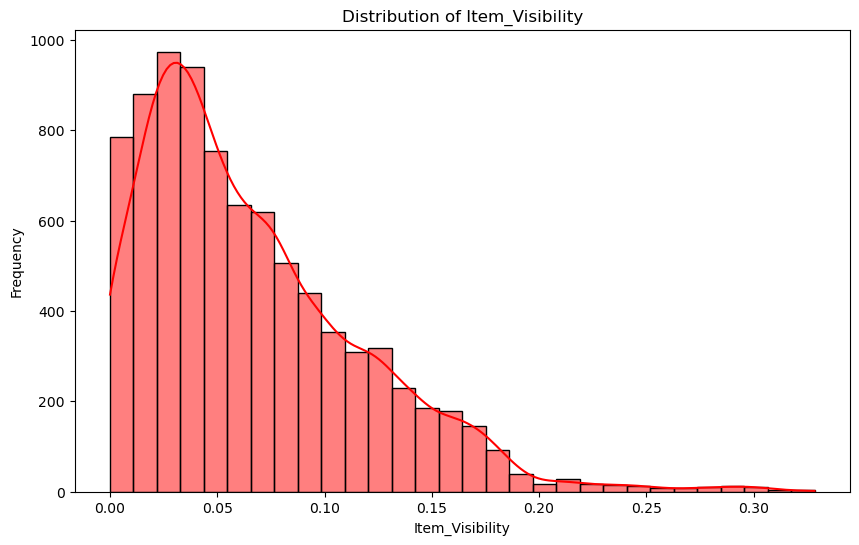

In [29]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Item_Visibility'], bins=30,color='red', kde=True)
plt.title('Distribution of Item_Visibility')
plt.xlabel('Item_Visibility')
plt.ylabel('Frequency')
plt.show()

In [30]:
columns_list

Index(['Item_Identifier', 'Item_Weight', 'Item_Fat_Content', 'Item_Visibility',
       'Item_Type', 'Item_MRP', 'Outlet_Identifier',
       'Outlet_Establishment_Year', 'Outlet_Size', 'Outlet_Location_Type',
       'Outlet_Type', 'Item_Outlet_Sales'],
      dtype='object')

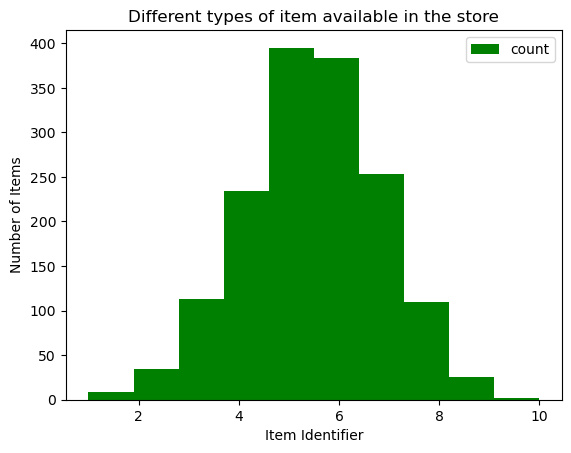

In [31]:
df['Item_Identifier'].value_counts().plot.hist(color='green')
plt.title('Different types of item available in the store')
plt.xlabel('Item Identifier')
plt.ylabel('Number of Items')
plt.legend()
plt.show()

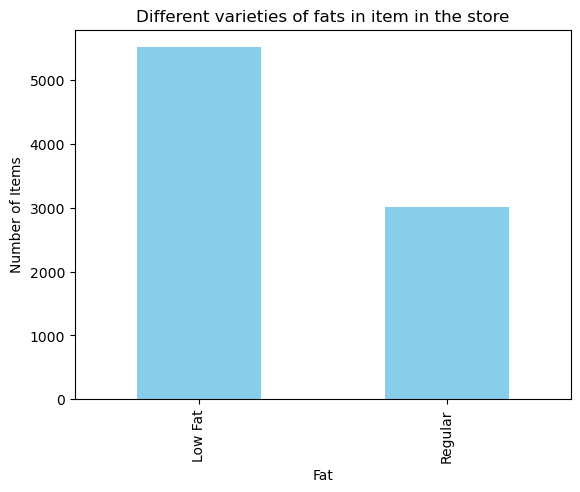

In [32]:
df['Item_Fat_Content'].value_counts().plot.bar(color='skyblue')
plt.title('Different varieties of fats in item in the store')
plt.xlabel('Fat')
plt.ylabel('Number of Items')
plt.show()

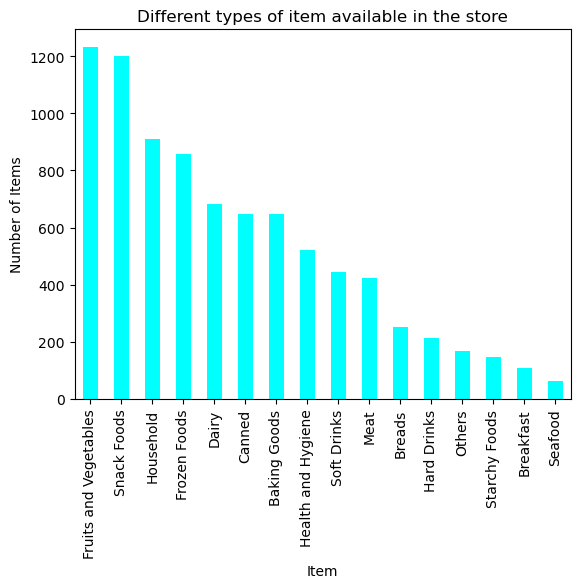

In [33]:
df['Item_Type'].value_counts().plot.bar(color='cyan')
plt.title('Different types of item available in the store')
plt.xlabel('Item')
plt.ylabel('Number of Items')
plt.show()

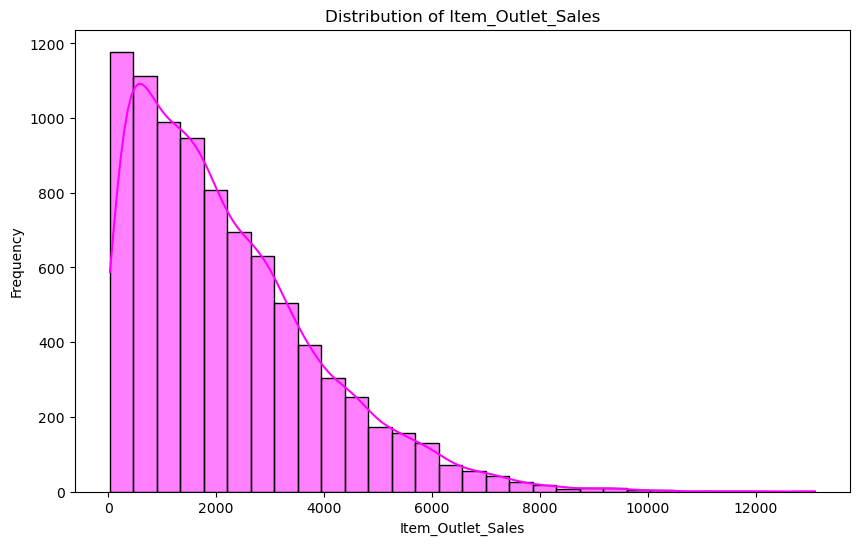

In [34]:
plt.figure(figsize=(10, 6))
sns.histplot(df['Item_Outlet_Sales'], bins=30, color='magenta', kde=True)
plt.title('Distribution of Item_Outlet_Sales')
plt.xlabel('Item_Outlet_Sales')
plt.ylabel('Frequency')
plt.show()

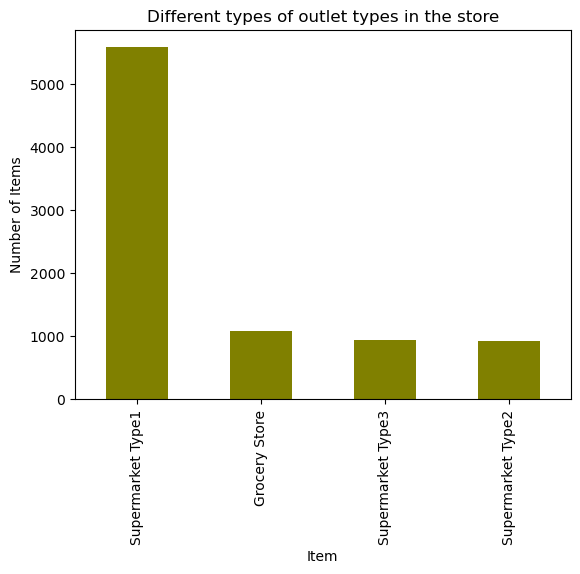

In [35]:
df['Outlet_Type'].value_counts().plot.bar(color='olive')
plt.title('Different types of outlet types in the store')
plt.xlabel('Item')
plt.ylabel('Number of Items')
plt.show()

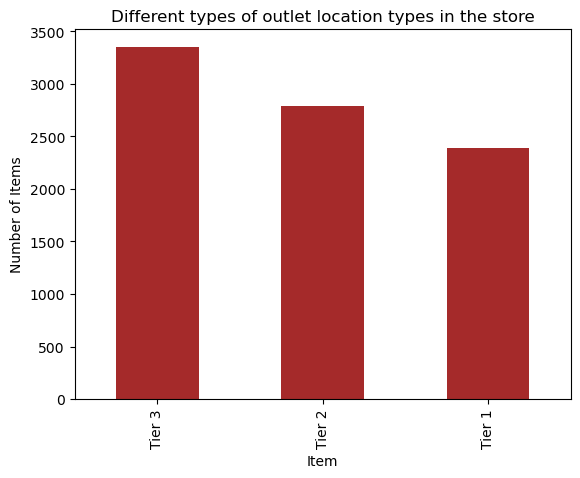

In [36]:
df['Outlet_Location_Type'].value_counts().plot.bar(color='brown')
plt.title('Different types of outlet location types in the store')
plt.xlabel('Item')
plt.ylabel('Number of Items')
plt.show()

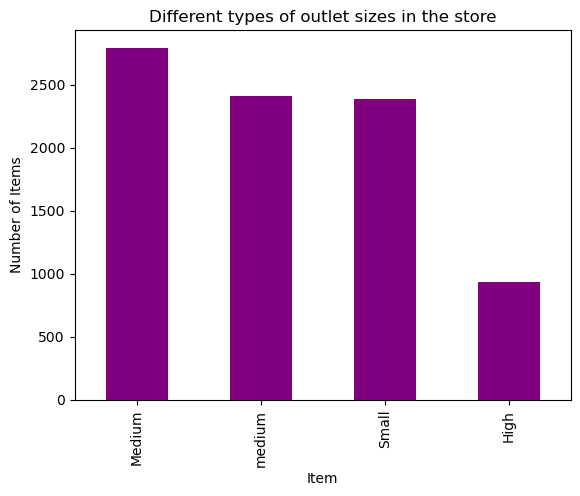

In [37]:
df['Outlet_Size'].value_counts().plot.bar(color='purple')
plt.title('Different types of outlet sizes in the store')
plt.xlabel('Item')
plt.ylabel('Number of Items')
plt.show()

<Axes: xlabel='Item_Fat_Content'>

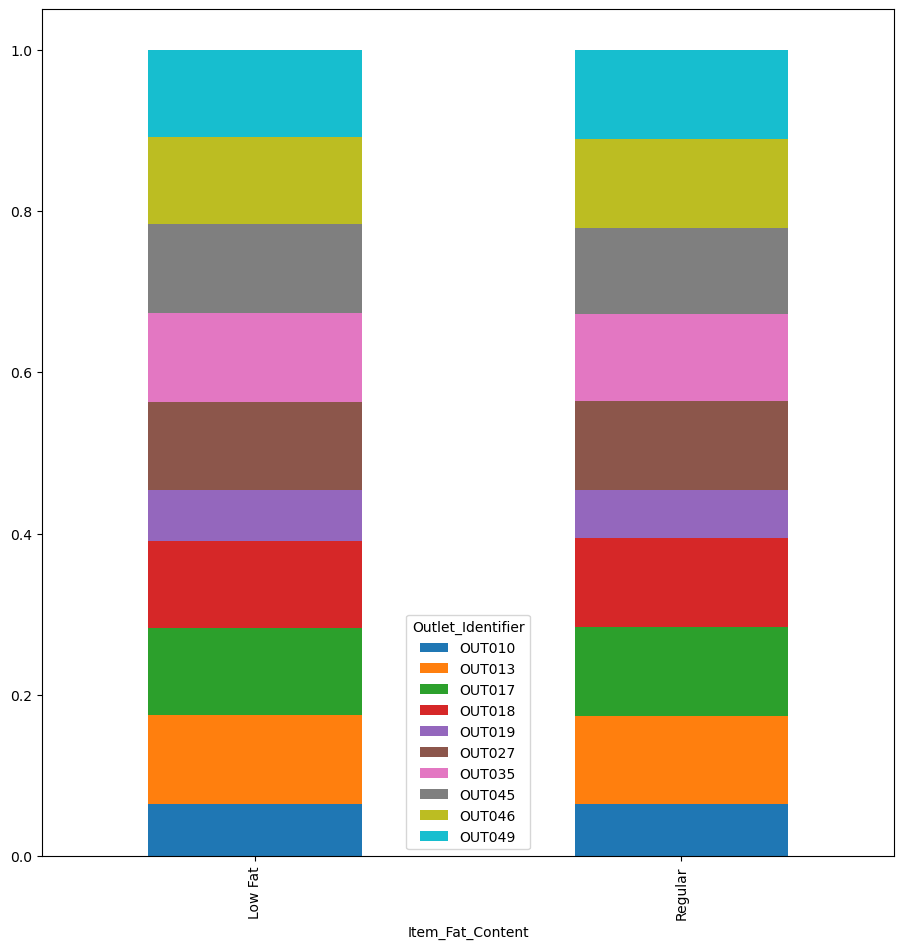

In [38]:
#Item_Fat_Content & Outlet_Identifier
Item_Fat_Content = pd.crosstab(df['Item_Fat_Content'],df['Outlet_Identifier'])
Item_Fat_Content.div(Item_Fat_Content.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True, figsize=(11, 11))

<Axes: xlabel='Item_Type'>

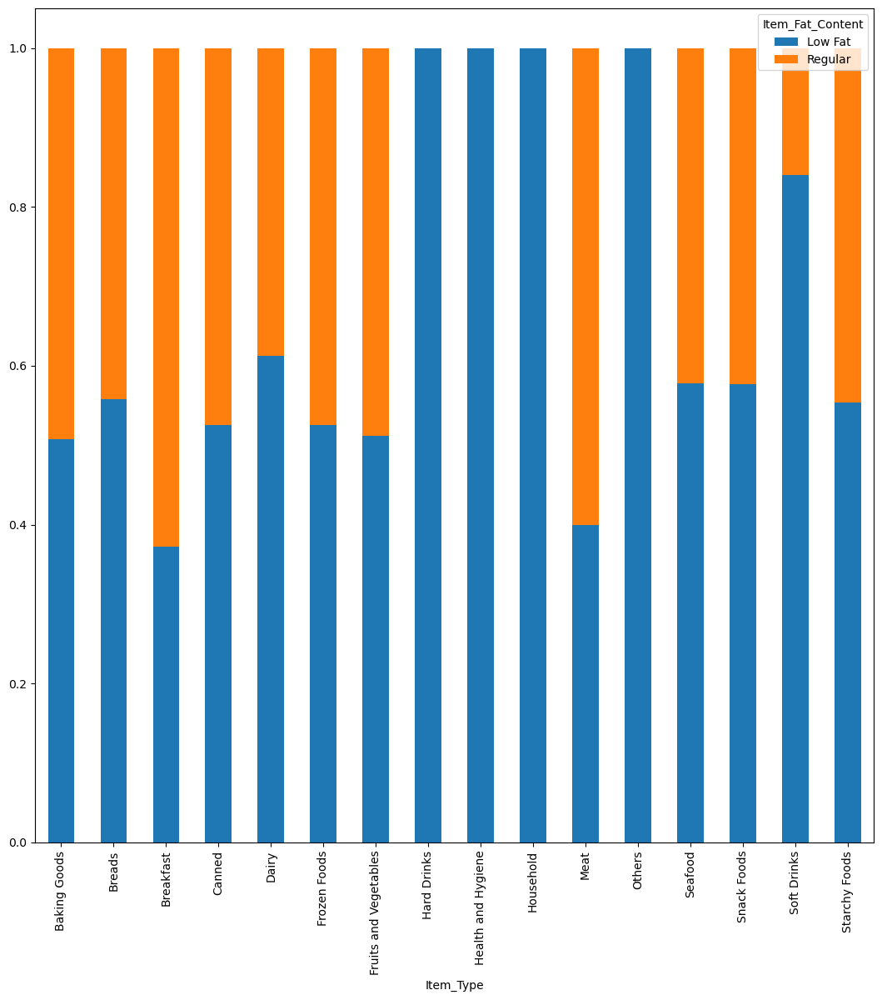

In [39]:
# fat content & item type
Item_Type = pd.crosstab(df['Item_Type'], df['Item_Fat_Content'])
Item_Type.div(Item_Type.sum(1).astype(float), axis=0).plot(kind="bar", stacked=True, figsize=(13, 13))

### Outliers

### Calculating Quantiles

In [40]:
Quantile_1 = df["Item_Outlet_Sales"].quantile(0.25)
Quantile_1

834.2474

In [41]:
Quantile_3 = df["Item_Outlet_Sales"].quantile(0.75)
Quantile_3

3101.2964

In [42]:
IQR = Quantile_3 - Quantile_1
IQR

2267.049

### Calculating Lower bound and upper bound

In [44]:
Lower = Quantile_1 - 1.5*IQR
Lower

-2566.3261

In [45]:
Upper = Quantile_3 + 1.5*IQR
Upper

6501.8699

In [47]:
from sklearn.preprocessing import LabelEncoder

le=LabelEncoder()

for X in df.columns:
    if df[X].dtype == "object":
        df[X]=le.fit_transform(df[X])

In [48]:
X = df.iloc[:,0:-1]
Y = df.iloc[:,-1]

In [49]:
print(X.shape)
print(Y.shape)

(8523, 11)
(8523,)


In [ ]:
df

In [ ]:
df.drop('Item_Identifier', axis=1, inplace=True)

In [ ]:
df.drop('Item_Fat_Content', axis=1, inplace=True)

In [ ]:
df.drop('Item_Type', axis=1, inplace=True)

In [ ]:
df.drop('Outlet_Identifier', axis=1, inplace=True)

In [ ]:
df.drop('Outlet_Size', axis=1, inplace=True)

In [ ]:
df.drop('Outlet_Type', axis=1, inplace=True)

In [ ]:
df.drop('Outlet_Location_Type', axis=1, inplace=True)

In [50]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()

scaler.fit(X)
X = scaler.transform(X)

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   int32  
 1   Item_Weight                8523 non-null   float64
 2   Item_Fat_Content           8523 non-null   int32  
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   int32  
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   int32  
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                8523 non-null   int32  
 9   Outlet_Location_Type       8523 non-null   int32  
 10  Outlet_Type                8523 non-null   int32  
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int32(7), int64(1)
memory usage: 566.1 KB


In [52]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   int32  
 1   Item_Weight                8523 non-null   float64
 2   Item_Fat_Content           8523 non-null   int32  
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   int32  
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   int32  
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                8523 non-null   int32  
 9   Outlet_Location_Type       8523 non-null   int32  
 10  Outlet_Type                8523 non-null   int32  
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int32(7), int64(1)
memory usage: 566.1 KB


In [53]:
from sklearn.model_selection import train_test_split  

X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.3)

In [54]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(5966, 11)
(5966,)
(2557, 11)
(2557,)


### Linear Regression

In [55]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

model = LinearRegression()
model.fit(X_train, Y_train)

# predicting the  test set results
Y_pred = model.predict(X_test)
print(Y_pred)

# finding the mean squared error and variance
mse = mean_squared_error(Y_test, Y_pred)
print('RMSE :', np.sqrt(mse))
print('Variance score: %.2f' % r2_score(Y_test, Y_pred))

[1536.58233413  916.57780554 1105.04638582 ...  687.57635565 2542.89553373
 3826.23313219]
RMSE : 1219.5987226394755
Variance score: 0.50


### AdaBoostRegressor

In [56]:
from sklearn.ensemble import AdaBoostRegressor

model= AdaBoostRegressor(n_estimators = 100)
model.fit(X_train, Y_train)

# predicting the test set results
Y_pred = model.predict(X_test)

# RMSE
mse = mean_squared_error(Y_test, Y_pred)
print("RMSE :", np.sqrt(mse))

RMSE : 1199.3064903910267


### GradientBoostingRegressor

In [57]:
from sklearn.ensemble import GradientBoostingRegressor

model = GradientBoostingRegressor()
model.fit(X_train, Y_train)

# predicting the test set results
Y_pred = model.predict(X_test)
print(Y_pred)

# Calculating the root mean squared error
print("RMSE :", np.sqrt(((Y_test - Y_pred)**2).sum()/len(Y_test)))

[2095.52373639 1190.90126175 1463.550856   ...  668.5463064  2486.50903087
 3780.13582273]
RMSE : 1102.0500483032133


### Random Forest Regression

In [58]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor(n_estimators = 100 , n_jobs = -1)
model.fit(X_train, Y_train)

# predicting the  test set results
Y_pred = model.predict(X_test)
print(Y_pred)

# finding the mean squared error and variance
mse = mean_squared_error(Y_test, Y_pred)
print("RMSE :",np.sqrt(mse))
print('Variance score: %.2f' % r2_score(Y_test, Y_pred))

print("Result :",model.score(X_train, Y_train))

[1891.650986  837.77614  1333.237868 ...  825.518762 3084.098786
 3194.002392]
RMSE : 1148.0286362401077
Variance score: 0.56
Result : 0.937102083823698


### DecisionTreeRegressor

In [59]:
from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor()
model.fit(X_train, Y_train)

# predicting the test set results
Y_pred = model.predict(X_test)
print(Y_pred)

print(" RMSE : " , np.sqrt(((Y_test - Y_pred)**2).sum()/len(Y_test)))

[2956.152   154.4656 1797.66   ... 1168.479  3353.6346 2996.1   ]
 RMSE :  1534.3403978572733


### Support vector machine

In [60]:
from sklearn.svm import SVR

model = SVR()
model.fit(X_train, Y_train)

# predicting the X test results
Y_pred = model.predict(X_test)

# Calculating the RMSE Score
mse = mean_squared_error(Y_test, Y_pred)
print("RMSE :", np.sqrt(mse))

RMSE : 1687.6690671498438
